In [1]:
# Import required libraries and modules
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Set data path
DATA_PATH = '../data/'

# Import improved background removal module
from background_removal import remove_background, process_all_images

# Import color classification module
from color_classification import (
    classify_butterflies_by_color, 
    visualize_color_classification,
    analyze_hue_distribution
)

# Import collection display module
from collection_display import (
    create_collection_display,
    create_configurable_display
)

# Import odd one out detection module
from odd_detector_v1 import (
    find_odd_butterflies,
    visualize_odd_detection_results
)

print(f"Data path: {DATA_PATH}")
print(f"Files in data directory: {os.listdir(DATA_PATH)}")


Data path: ../data/
Files in data directory: ['Image_643.jpg', 'Image_241.jpg', 'Image_264.jpg', 'Image_129.jpg', 'Image_260.jpg', 'Image_6.jpg', 'Image_1587.jpg', 'Image_205.jpg', 'Image_177.jpg', 'Image_216.jpg', 'Image_559.jpg', 'Image_1057.jpg']


In [2]:
# Process all butterfly images with improved background removal
print("Processing all images with improved background removal methods...")
print("Methods will be tried in order: GrabCut (2 variants), Advanced Color, Watershed, Fallback")
print("="*80)

# Get all image files
image_files = [f for f in os.listdir(DATA_PATH) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
image_files.sort()  # Sort for consistent ordering

print(f"Found {len(image_files)} images")

# Process all images with detailed feedback
all_results = {}
for i, image_file in enumerate(image_files, 1):
    print(f"\n[{i}/{len(image_files)}] Processing {image_file}...")
    image_path = os.path.join(DATA_PATH, image_file)
    try:
        processed_image, mask = remove_background(image_path)
        all_results[image_file] = (processed_image, mask)
        print(f"✓ Successfully processed {image_file}")
    except Exception as e:
        print(f"✗ Error processing {image_file}: {e}")

print(f"\n{'='*80}")
print(f"Successfully processed {len(all_results)}/{len(image_files)} images")


Processing all images with improved background removal methods...
Methods will be tried in order: GrabCut (2 variants), Advanced Color, Watershed, Fallback
Found 12 images

[1/12] Processing Image_1057.jpg...
Method grabcut_auto: quality score = 0.954
Using grabcut_auto (score: 0.954)
✓ Successfully processed Image_1057.jpg

[2/12] Processing Image_129.jpg...
Method grabcut_auto: quality score = 0.851
Using grabcut_auto (score: 0.851)
✓ Successfully processed Image_129.jpg

[3/12] Processing Image_1587.jpg...
Method grabcut_auto: quality score = 0.859
Using grabcut_auto (score: 0.859)
✓ Successfully processed Image_1587.jpg

[4/12] Processing Image_177.jpg...
Method grabcut_auto: quality score = 0.901
Using grabcut_auto (score: 0.901)
✓ Successfully processed Image_177.jpg

[5/12] Processing Image_205.jpg...
Method grabcut_auto: quality score = 0.955
Using grabcut_auto (score: 0.955)
✓ Successfully processed Image_205.jpg

[6/12] Processing Image_216.jpg...
Method grabcut_auto: quality

Complete Improved Comparison: Original | Enhanced Mask | Enhanced Background Removal


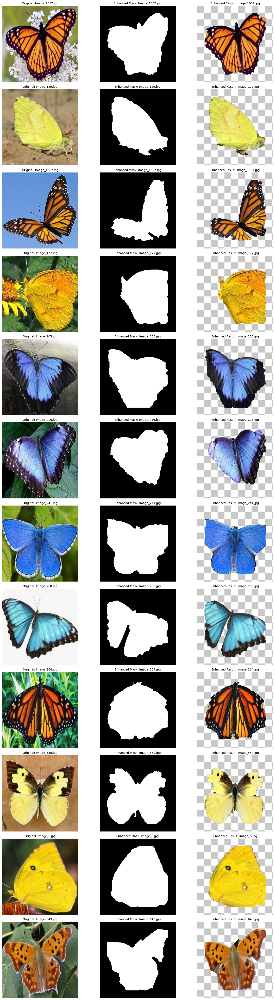


✅ Enhanced background removal visualization complete for all 12 images!

Key improvements:
• GrabCut algorithm for robust foreground/background separation
• Multiple initialization strategies for different image types
• Automatic quality evaluation and method selection
• Advanced color space analysis (HSV + LAB)
• Watershed segmentation for complex scenes
• Intelligent fallback mechanisms
• Checkerboard background for better transparency visualization


In [3]:
# Create comprehensive comparison: Original | Improved Mask | Improved Result
print("Complete Improved Comparison: Original | Enhanced Mask | Enhanced Background Removal")
fig, axes = plt.subplots(len(all_results), 3, figsize=(15, 4*len(all_results)))

# If only one image, make sure axes is 2D
if len(all_results) == 1:
    axes = axes.reshape(1, -1)

# Create checkerboard pattern for transparent background visualization
def create_checkerboard_background(height, width, tile_size=20):
    """Create a checkerboard pattern background."""
    checkerboard = np.zeros((height, width, 3), dtype=np.uint8)
    # Light gray and white pattern
    for i in range(0, height, tile_size):
        for j in range(0, width, tile_size):
            if (i // tile_size + j // tile_size) % 2 == 0:
                checkerboard[i:i+tile_size, j:j+tile_size] = [200, 200, 200]  # Light gray
            else:
                checkerboard[i:i+tile_size, j:j+tile_size] = [255, 255, 255]  # White
    return checkerboard

for i, image_file in enumerate(sorted(all_results.keys())):
    # Original image
    original = cv2.imread(os.path.join(DATA_PATH, image_file))
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    axes[i, 0].imshow(original_rgb)
    axes[i, 0].set_title(f'Original: {image_file}', fontsize=10)
    axes[i, 0].axis('off')
    
    # Improved mask
    processed_image, mask = all_results[image_file]
    axes[i, 1].imshow(mask, cmap='gray')
    axes[i, 1].set_title(f'Enhanced Mask: {image_file}', fontsize=10)
    axes[i, 1].axis('off')
    
    # Improved processed image with checkerboard background
    processed_rgba = cv2.cvtColor(processed_image, cv2.COLOR_BGRA2RGBA)
    height, width = processed_rgba.shape[:2]
    
    # Create checkerboard background
    checkerboard = create_checkerboard_background(height, width)
    
    # Composite the butterfly onto checkerboard background
    alpha = processed_rgba[:, :, 3] / 255.0
    result_with_checkerboard = np.zeros((height, width, 3), dtype=np.uint8)
    
    for c in range(3):
        result_with_checkerboard[:, :, c] = (
            alpha * processed_rgba[:, :, c] + 
            (1 - alpha) * checkerboard[:, :, c]
        ).astype(np.uint8)
    
    axes[i, 2].imshow(result_with_checkerboard)
    axes[i, 2].set_title(f'Enhanced Result: {image_file}', fontsize=10)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

print(f"\n✅ Enhanced background removal visualization complete for all {len(all_results)} images!")
print("\nKey improvements:")
print("• GrabCut algorithm for robust foreground/background separation")
print("• Multiple initialization strategies for different image types")
print("• Automatic quality evaluation and method selection")
print("• Advanced color space analysis (HSV + LAB)")
print("• Watershed segmentation for complex scenes")
print("• Intelligent fallback mechanisms")
print("• Checkerboard background for better transparency visualization")


TASK 1.1: COLOR CLASSIFICATION

1. Analyzing HUE distribution...
Analyzing HUE distribution...


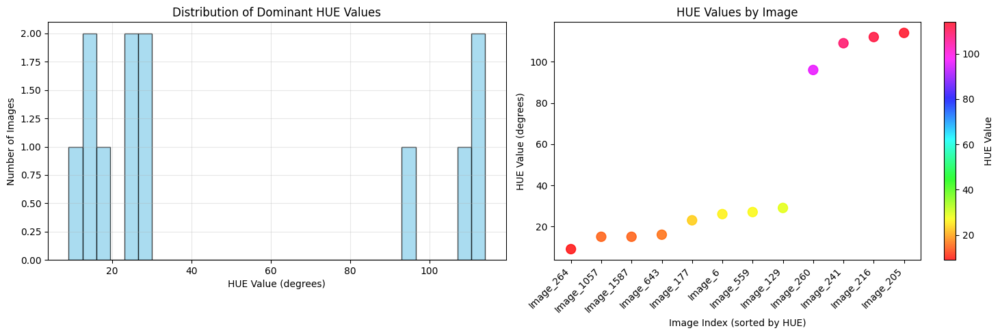


2. Classifying butterflies by color...
Extracting HUE features from butterfly images...
Image_1057.jpg: Mean HUE = 57.7°, Dominant HUE = 15.0°
Image_129.jpg: Mean HUE = 28.8°, Dominant HUE = 29.0°
Image_1587.jpg: Mean HUE = 36.0°, Dominant HUE = 15.0°
Image_177.jpg: Mean HUE = 21.7°, Dominant HUE = 23.0°
Image_205.jpg: Mean HUE = 113.0°, Dominant HUE = 114.0°
Image_216.jpg: Mean HUE = 116.4°, Dominant HUE = 112.0°
Image_241.jpg: Mean HUE = 108.8°, Dominant HUE = 109.0°
Image_260.jpg: Mean HUE = 84.4°, Dominant HUE = 96.0°
Image_264.jpg: Mean HUE = 44.1°, Dominant HUE = 9.0°
Image_559.jpg: Mean HUE = 26.4°, Dominant HUE = 27.0°
Image_6.jpg: Mean HUE = 25.3°, Dominant HUE = 26.0°
Image_643.jpg: Mean HUE = 16.5°, Dominant HUE = 16.0°
HUE distribution: min=9.0°, max=114.0°
Fixed color divisions didn't work well, using quantile-based grouping...
Group 0: HUE range 9.0°-16.0°, 4 images
Group 1: HUE range 23.0°-29.0°, 4 images
Group 2: HUE range 96.0°-114.0°, 4 images

Red Group (Average HUE

In [4]:
# Task 1.1: Color Classification using HUE analysis
print("="*80)
print("TASK 1.1: COLOR CLASSIFICATION")
print("="*80)

# First, analyze the HUE distribution of all butterflies
print("\n1. Analyzing HUE distribution...")
hue_data = analyze_hue_distribution(all_results)

# Classify butterflies into 3 color groups with 4 images each
print("\n2. Classifying butterflies by color...")
color_groups = classify_butterflies_by_color(all_results, target_groups=3, images_per_group=4)

print(f"\n✅ Color classification complete!")
print(f"Created {len(color_groups)} color groups with 4 images each")


3. Visualizing color classification results...


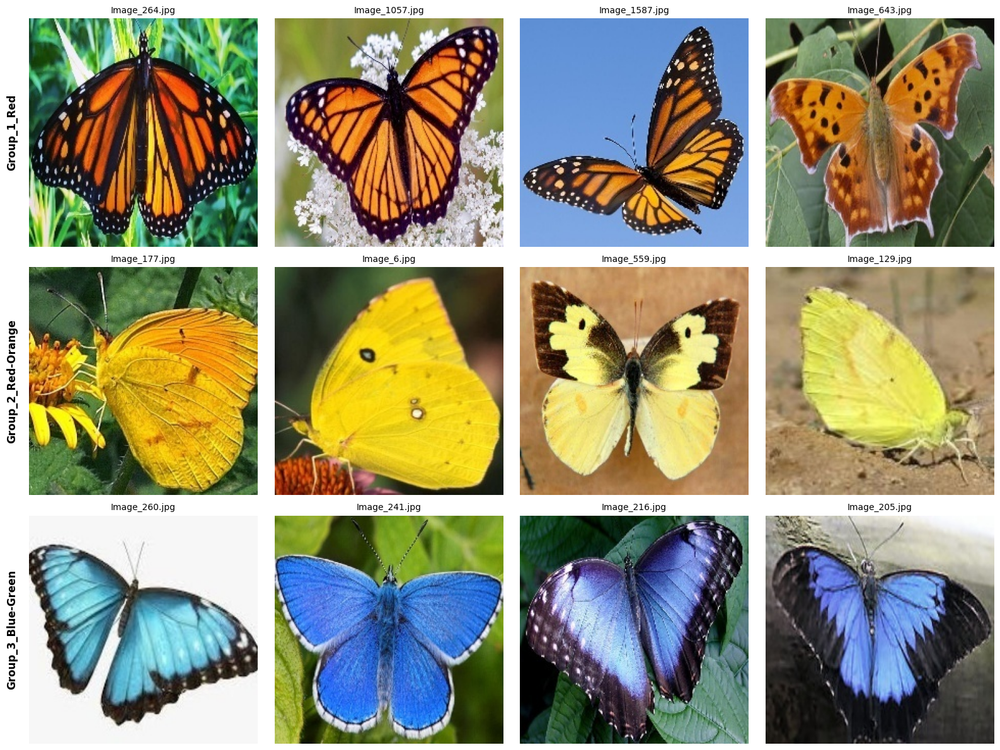


COLOR CLASSIFICATION SUMMARY
Total images classified: 12
Number of color groups: 3

Group_1_Red: 4 images
  • Image_264.jpg (HUE: 9.0°)
  • Image_1057.jpg (HUE: 15.0°)
  • Image_1587.jpg (HUE: 15.0°)
  • Image_643.jpg (HUE: 16.0°)

Group_2_Red-Orange: 4 images
  • Image_177.jpg (HUE: 23.0°)
  • Image_6.jpg (HUE: 26.0°)
  • Image_559.jpg (HUE: 27.0°)
  • Image_129.jpg (HUE: 29.0°)

Group_3_Blue-Green: 4 images
  • Image_260.jpg (HUE: 96.0°)
  • Image_241.jpg (HUE: 109.0°)
  • Image_216.jpg (HUE: 112.0°)
  • Image_205.jpg (HUE: 114.0°)

✅ Task 1.1 completed successfully!
Method used: HUE-based grouping on background-removed butterfly images (NO ML)
• Focused only on butterfly colors (no background interference)
• Used fixed color wheel divisions or simple quantile-based grouping
• NO machine learning algorithms - purely classical image processing
• Forced balanced grouping: 3 groups × 4 images each


In [5]:
# Visualize the color classification results
print("3. Visualizing color classification results...")
visualize_color_classification(all_results, color_groups)

# Print detailed classification summary
print("\n" + "="*80)
print("COLOR CLASSIFICATION SUMMARY")
print("="*80)

total_images = sum(len(group) for group in color_groups.values())
print(f"Total images classified: {total_images}")
print(f"Number of color groups: {len(color_groups)}")

for group_name, image_list in color_groups.items():
    print(f"\n{group_name}: {len(image_list)} images")
    for img in image_list:
        hue_val = hue_data.get(img, 0)
        print(f"  • {img} (HUE: {hue_val:.1f}°)")

print(f"\n✅ Task 1.1 completed successfully!")
print("Method used: HUE-based grouping on background-removed butterfly images (NO ML)")
print("• Focused only on butterfly colors (no background interference)")
print("• Used fixed color wheel divisions or simple quantile-based grouping")  
print("• NO machine learning algorithms - purely classical image processing")
print("• Forced balanced grouping: 3 groups × 4 images each")



TASK 1.3: COLLECTION DISPLAY

1. Creating butterfly collection displays...

A. Standard Collection Display (1200x800, gradient background)
Creating collection display with layout: {'Group_1_Red': {'group_index': 0, 'y_start': 0, 'y_end': 200, 'images_per_row': 2, 'rows': 2, 'image_width': 800, 'image_height': 100, 'num_images': 4}, 'Group_2_Red-Orange': {'group_index': 1, 'y_start': 200, 'y_end': 400, 'images_per_row': 2, 'rows': 2, 'image_width': 800, 'image_height': 100, 'num_images': 4}, 'Group_3_Blue-Green': {'group_index': 2, 'y_start': 400, 'y_end': 600, 'images_per_row': 2, 'rows': 2, 'image_width': 800, 'image_height': 100, 'num_images': 4}}
Output resolution: 1600x600
Background: gradient ((220, 235, 250))

C. Minimal Display (1 per class, 600x400, solid background)
Creating collection display with layout: {'Group_1_Red': {'group_index': 0, 'y_start': 0, 'y_end': 400, 'images_per_row': 1, 'rows': 1, 'image_width': 1600, 'image_height': 400, 'num_images': 1}, 'Group_2_Red-Oran

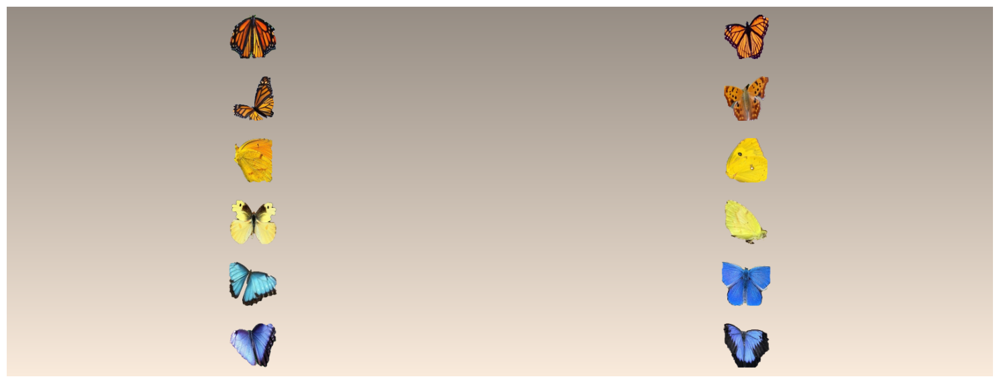


MINIMAL DISPLAY:


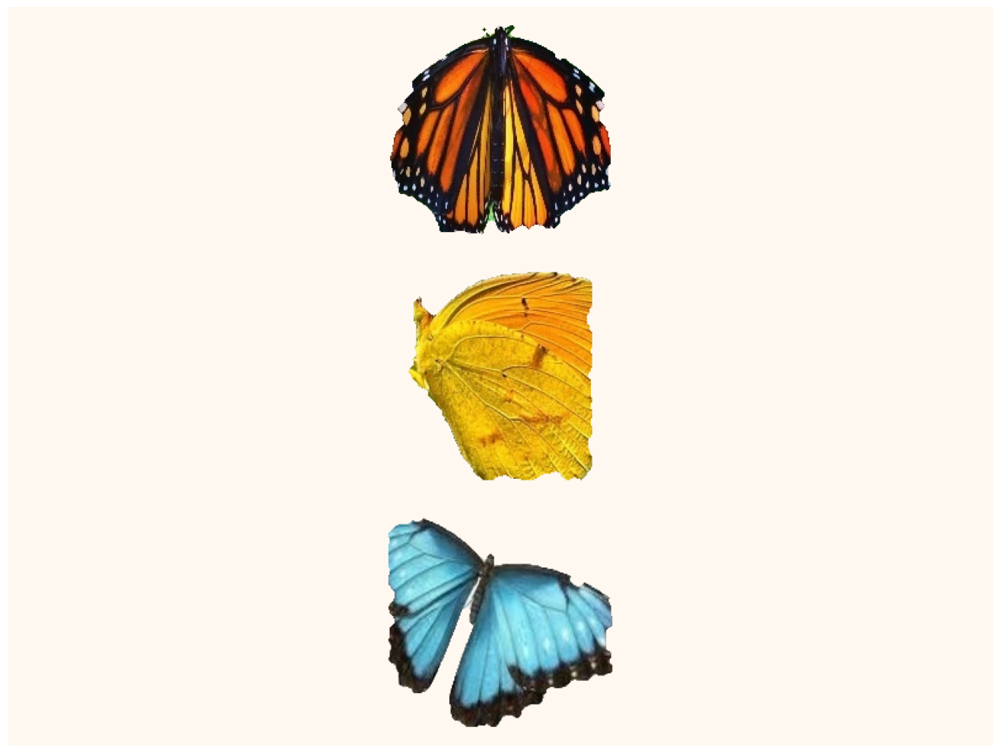


HIGH_RES DISPLAY:


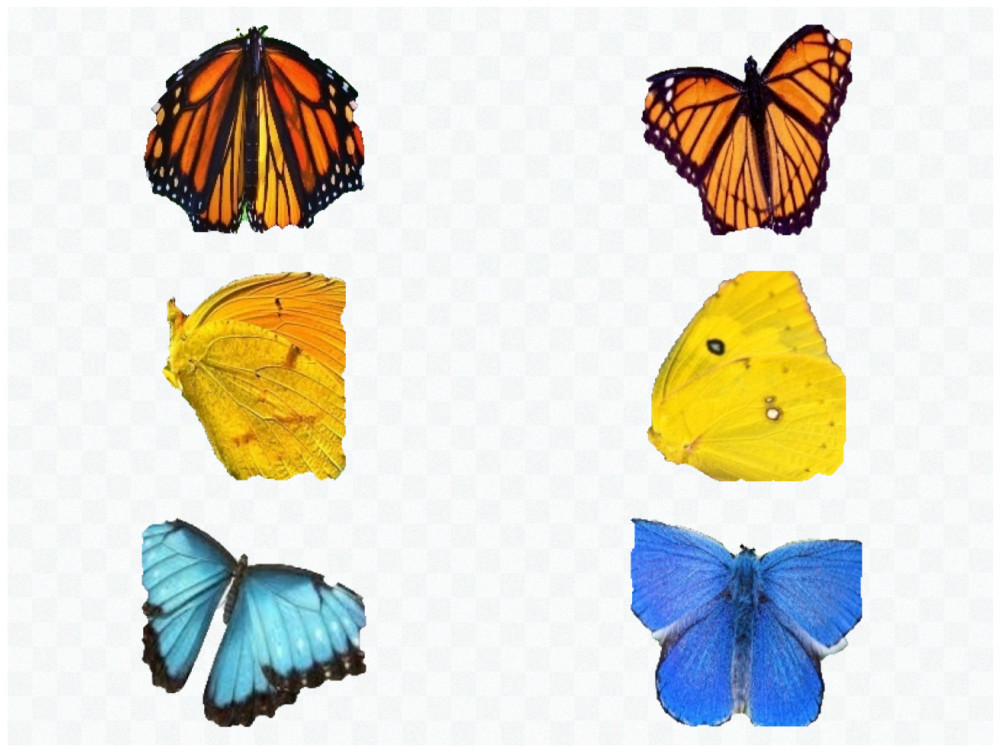


✅ Successfully displayed all 3 collection configurations!
Each display shows different settings:
• Standard: All butterflies, 1200x800, gradient background
• Compact: 3 per class, 800x600, solid background
• Minimal: 1 per class (3 total), 600x400, solid background
• High-res: All butterflies, 1600x1200, textured background


In [11]:
# Task 1.3: Collection Display
print("\n" + "="*80)
print("TASK 1.3: COLLECTION DISPLAY")
print("="*80)

print("\n1. Creating butterfly collection displays...")

# Create different display configurations to showcase flexibility
displays = {}

# Standard display: All butterflies, 1200x800 resolution, gradient background
print("\nA. Standard Collection Display (1200x800, gradient background)")
displays['standard'] = create_configurable_display(
    color_groups, all_results, 
    images_per_class=None,  # All images
    output_resolution=(1600, 600),
    background_style="gradient"
)

# # Compact display: 3 images per class, smaller resolution
# print("\nB. Compact Display (3 per class, 800x600, solid background)")
# displays['compact'] = create_configurable_display(
#     color_groups, all_results,
#     images_per_class=3,
#     output_resolution=(800, 600), 
#     background_style="solid"
# )

# Minimal display: 1 image per class (only 3 butterflies total)
print("\nC. Minimal Display (1 per class, 600x400, solid background)")
displays['minimal'] = create_configurable_display(
    color_groups, all_results,
    images_per_class=1,
    output_resolution=(1600, 1200),
    background_style="solid"
)

# High-res display: All butterflies, large resolution, textured background
print("\nD. High-Resolution Display (1600x1200, textured background)")
displays['high_res'] = create_configurable_display(
    color_groups, all_results,
    images_per_class=2,
    output_resolution=(1600, 1200),
    background_style="textured"
)

print(f"\n✅ Created {len(displays)} different collection displays!")
print("Demonstrates configurable N images per class and resolution as requested.")

print("\n2. Displaying collection displays...")

# Display each collection display (clean, no legends)
for display_name, display_image in displays.items():
    print(f"\n{display_name.upper()} DISPLAY:")
    
    plt.figure(figsize=(15, 10))
    
    # Convert BGR to RGB for display
    display_rgb = cv2.cvtColor(display_image, cv2.COLOR_BGR2RGB)
    
    plt.imshow(display_rgb)
    plt.axis('off')  # No titles, labels, or legends
    
    plt.tight_layout()
    plt.show()

print(f"\n✅ Successfully displayed all {len(displays)} collection configurations!")
print("Each display shows different settings:")
print("• Standard: All butterflies, 1200x800, gradient background") 
print("• Compact: 3 per class, 800x600, solid background")
print("• Minimal: 1 per class (3 total), 600x400, solid background")
print("• High-res: All butterflies, 1600x1200, textured background")



TASK 1.4: BOLD COLOR DISTRIBUTION ODD ONE OUT DETECTION

1. Using BOLD color distribution analysis for precise species detection...
   Focus: Multi-color patterns > Black presence > Color complexity > Color entropy
Finding odd butterflies using IMPROVED COLOR DISTRIBUTION ANALYSIS...

Analyzing group: Group_1_Red
Images: ['Image_264.jpg', 'Image_1057.jpg', 'Image_1587.jpg', 'Image_643.jpg']
  Processing Image_264.jpg for color distribution...
Method grabcut_auto: quality score = 0.917
Using grabcut_auto (score: 0.917)
  Processing Image_1057.jpg for color distribution...
Method grabcut_auto: quality score = 0.954
Using grabcut_auto (score: 0.954)
  Processing Image_1587.jpg for color distribution...
Method grabcut_auto: quality score = 0.786
Using grabcut_auto (score: 0.786)
  Processing Image_643.jpg for color distribution...
Method grabcut_auto: quality score = 0.967
Using grabcut_auto (score: 0.967)
  IMPROVED Color Distribution Analysis for 4 butterflies...
    Image_264.jpg:
    

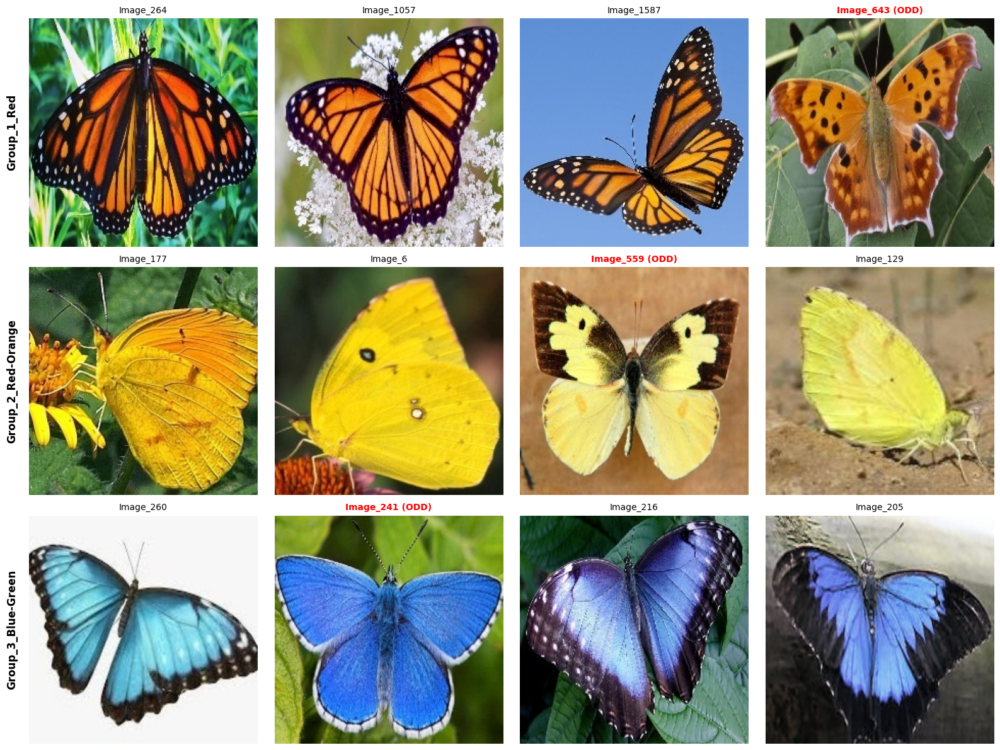


BOLD COLOR DISTRIBUTION ODD DETECTION SUMMARY

Group_1_Red:
  All images: ['Image_264.jpg', 'Image_1057.jpg', 'Image_1587.jpg', 'Image_643.jpg']
  Odd butterfly: Image_643.jpg ⚠️
  Similar species: ['Image_264.jpg', 'Image_1057.jpg', 'Image_1587.jpg']

Group_2_Red-Orange:
  All images: ['Image_177.jpg', 'Image_6.jpg', 'Image_559.jpg', 'Image_129.jpg']
  Odd butterfly: Image_559.jpg ⚠️
  Similar species: ['Image_177.jpg', 'Image_6.jpg', 'Image_129.jpg']

Group_3_Blue-Green:
  All images: ['Image_260.jpg', 'Image_241.jpg', 'Image_216.jpg', 'Image_205.jpg']
  Odd butterfly: Image_241.jpg ⚠️
  Similar species: ['Image_260.jpg', 'Image_216.jpg', 'Image_205.jpg']

✅ Task 1.4 completed with BOLD color distribution approach!
Color Distribution Method Features:
🎨 MULTI-COLOR ANALYSIS (Highest Priority):
  • Multi-color presence detection (yellow+black vs pure yellow)
  • Black ratio analysis (key for Group 2)
  • Color complexity variance in HSV space
🌈 COLOR PATTERN FEATURES (High Priority):


In [7]:
# Task 1.4: Bold Color Distribution Odd One Out Detection
print("\n" + "="*80)
print("TASK 1.4: BOLD COLOR DISTRIBUTION ODD ONE OUT DETECTION")
print("="*80)

print("\n1. Using BOLD color distribution analysis for precise species detection...")
print("   Focus: Multi-color patterns > Black presence > Color complexity > Color entropy")

# Import the new color distribution detector
from odd_detector_v2 import find_odd_by_color_distribution

# Find odd butterflies using PURE color distribution analysis
odd_butterflies = find_odd_by_color_distribution(color_groups, data_path="../data/")

print("\n2. Visualizing color distribution odd one out detection results...")
# Note: You can still use the existing visualization function
visualize_odd_detection_results(color_groups, all_results, odd_butterflies)

# Print detailed summary
print("\n" + "="*80)
print("BOLD COLOR DISTRIBUTION ODD DETECTION SUMMARY")
print("="*80)

for group_name, odd_butterfly in odd_butterflies.items():
    group_images = color_groups[group_name]
    print(f"\n{group_name}:")
    print(f"  All images: {group_images}")
    print(f"  Odd butterfly: {odd_butterfly} ⚠️")
    print(f"  Similar species: {[img for img in group_images if img != odd_butterfly]}")

print(f"\n✅ Task 1.4 completed with BOLD color distribution approach!")
print("Color Distribution Method Features:")
print("🎨 MULTI-COLOR ANALYSIS (Highest Priority):")
print("  • Multi-color presence detection (yellow+black vs pure yellow)")
print("  • Black ratio analysis (key for Group 2)")
print("  • Color complexity variance in HSV space")
print("🌈 COLOR PATTERN FEATURES (High Priority):")
print("  • Color entropy (randomness of color distribution)")
print("  • Secondary color presence detection")
print("  • Dominant color strength analysis")
print("⚡ COLOR CONTRAST & DISTRIBUTION (Medium Priority):")
print("  • Yellow presence ratio")
print("  • Color contrast within butterfly regions")
print("  • HSV variance analysis")
print("🔧 BACKGROUND REMOVAL INTEGRATION:")
print("  • Advanced background removal for clean color analysis")
print("  • Focus on butterfly pixels only (no background interference)")
print("\nThis BOLD approach targets the exact visual differences humans notice:")
print("👁️ Group 2: Yellow+Black complex patterns vs Pure Yellow simple patterns")
print("🎯 Optimized for species-level color pattern differentiation!")